In [1]:
from pathlib import Path

# Set path to dataset root (archive), which contains 'train', 'validate', and 'test'
dataset_path = Path("../data/kaggle-dataset/archive")

# Check the high-level folders (should be 'train', 'validate', 'test')
splits = [f for f in dataset_path.iterdir() if f.is_dir()]
print(f"📁 Found {len(splits)} dataset splits: {[s.name for s in splits]}")

# For each split, list all class folders inside
for split_path in splits:
    class_folders = sorted([f.name for f in split_path.iterdir() if f.is_dir()])
    print(f"\n📂 Split: '{split_path.name}' - {len(class_folders)} classes")
    print(class_folders[:10])  # Just show first 10 class names



📁 Found 3 dataset splits: ['test', 'train', 'valid']

📂 Split: 'test' - 50 classes
['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH', 'BLAIRS MOCHA', 'BLOTCHED EMERALD MOTH', 'BLUE BORDERED CARPET MOTH', 'CINNABAR MOTH', 'CLEARWING MOTH']

📂 Split: 'train' - 50 classes
['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH', 'BLAIRS MOCHA', 'BLOTCHED EMERALD MOTH', 'BLUE BORDERED CARPET MOTH', 'CINNABAR MOTH', 'CLEARWING MOTH']

📂 Split: 'valid' - 50 classes
['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH', 'BLAIRS MOCHA', 'BLOTCHED EMERALD MOTH', 'BLUE BORDERED CARPET MOTH', 'CINNABAR MOTH', 'CLEARWING MOTH']


In [5]:
from pathlib import Path

# Define paths
train_path = dataset_path / "train"
val_path = dataset_path / "valid"
test_path = dataset_path / "test"

# Function to count images in each class folder
def count_images_in_folder(folder_path):
    class_counts = {}
    for class_dir in sorted(folder_path.iterdir()):
        if class_dir.is_dir():
            num_images = len(list(class_dir.glob("*")))  # you can add "*.jpg"/"*.png" if needed
            class_counts[class_dir.name] = num_images
    return class_counts

# Count images
train_counts = count_images_in_folder(train_path)
val_counts = count_images_in_folder(val_path)
test_counts = count_images_in_folder(test_path)

# Print summaries
print(f"📁 TRAIN - Total classes: {len(train_counts)}, Total images: {sum(train_counts.values())}")
print(f"📁 VALIDATE - Total classes: {len(val_counts)}, Total images: {sum(val_counts.values())}")
print(f"📁 TEST - Total classes: {len(test_counts)}, Total images: {sum(test_counts.values())}")

# Optional: Show a few class image counts
print("\n🔍 Sample class counts (train):")
for cls, count in list(train_counts.items())[:5]:
    print(f"{cls}: {count} images")


📁 TRAIN - Total classes: 50, Total images: 7183
📁 VALIDATE - Total classes: 50, Total images: 250
📁 TEST - Total classes: 50, Total images: 250

🔍 Sample class counts (train):
ARCIGERA FLOWER MOTH: 140 images
ATLAS MOTH: 129 images
BANDED TIGER MOTH: 136 images
BIRD CHERRY ERMINE MOTH: 133 images
BLACK RUSTIC MOTH: 134 images


In [6]:
# List the species inside 'train'
species_folders = sorted([f.name for f in train_path.iterdir() if f.is_dir()])
print(f"Found {len(species_folders)} species in training set:")
print(species_folders[:10])  # Show the first 10



Found 50 species in training set:
['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH', 'BLAIRS MOCHA', 'BLOTCHED EMERALD MOTH', 'BLUE BORDERED CARPET MOTH', 'CINNABAR MOTH', 'CLEARWING MOTH']


- There are 50 species in each set.

In [7]:
# We will check the distribution of images for each species - here we see they are imbalanced
for species in species_folders:
    image_folder = train_path / species
    num_images = len(list(image_folder.glob("*")))
    print(f"{species}: {num_images} images")


ARCIGERA FLOWER MOTH: 140 images
ATLAS MOTH: 129 images
BANDED TIGER MOTH: 136 images
BIRD CHERRY ERMINE MOTH: 133 images
BLACK RUSTIC MOTH: 134 images
BLAIRS MOCHA: 177 images
BLOTCHED EMERALD MOTH: 117 images
BLUE BORDERED CARPET MOTH: 121 images
CINNABAR MOTH: 131 images
CLEARWING MOTH: 122 images
COMET MOTH: 105 images
DEATHS HEAD HAWK MOTH: 169 images
ELEPHANT HAWK MOTH: 160 images
EMPEROR GUM MOTH: 136 images
EMPEROR MOTH: 142 images
EYED HAWK MOTH: 165 images
FIERY CLEARWING MOTH: 139 images
GARDEN TIGER MOTH: 131 images
HERCULES MOTH: 137 images
HORNET MOTH: 120 images
HUMMING BIRD HAWK MOTH: 143 images
IO MOTH: 120 images
JULY BELLE MOTH: 186 images
KENTISH GLORY MOTH: 175 images
LACE BORDER MOTH: 175 images
LEOPARD MOTH: 167 images
LUNA MOTH: 117 images
MADAGASCAN SUNSET MOTH: 123 images
MAGPIE MOTH: 170 images
MUSLIN MOTH: 168 images
OLEANDER HAWK MOTH: 132 images
OWL MOTH: 121 images
PALPITA VITREALIS MOTH: 174 images
PEACH BLOSSOM MOTH: 149 images
PLUME MOTH: 170 images
PO

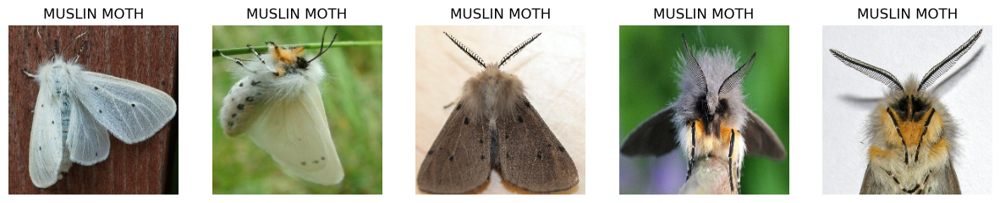

In [8]:
import random
import matplotlib.pyplot as plt
from PIL import Image

# Pick a random species and load 5 sample images
sample_species = random.choice(species_folders)
sample_images = list((train_path / sample_species).glob("*"))[:5]

# Plot the images
plt.figure(figsize=(15, 5))
for i, img_path in enumerate(sample_images):
    with open(img_path, 'rb') as f:  # This avoids permission issues
        img = Image.open(f)
        img = img.convert('RGB')  # In case of .png with alpha channel
        plt.subplot(1, 5, i + 1)
        plt.imshow(img)
        plt.title(sample_species)
        plt.axis("off")
plt.show()


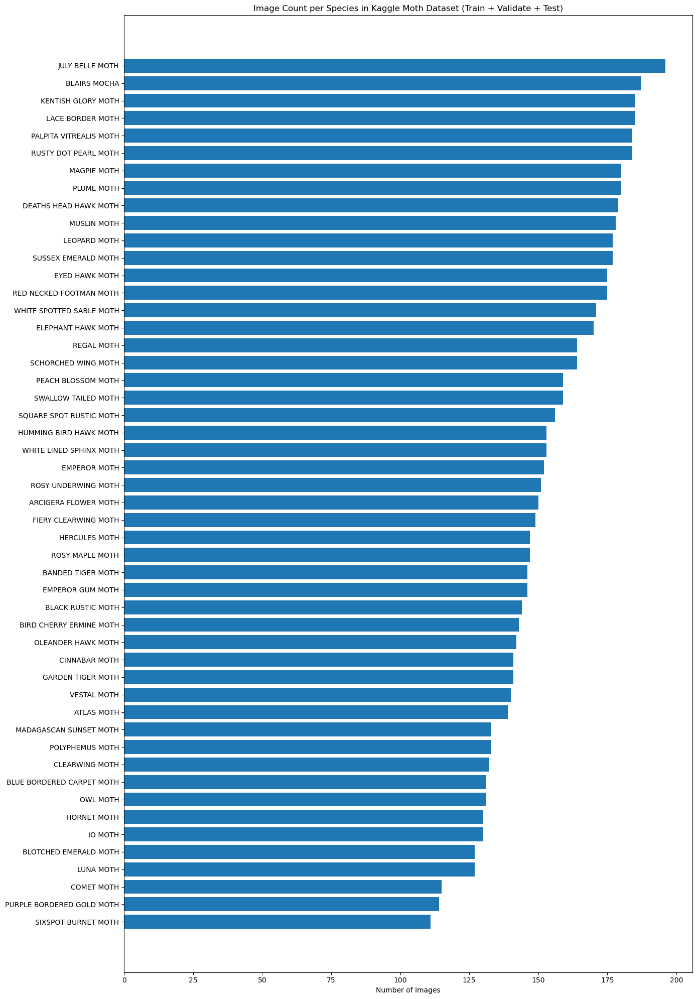

In [9]:
from collections import defaultdict
from pathlib import Path
import matplotlib.pyplot as plt

# Folders to scan
folders = ['train', 'valid', 'test']  # Corrected 'valid' to 'validate'

# Count images per species
species_counts = defaultdict(int)

for folder in folders:
    folder_path = dataset_path / folder
    if not folder_path.exists():
        print(f"Folder not found: {folder_path}")
        continue
    for species_dir in folder_path.iterdir():
        if species_dir.is_dir():
            num_images = len(list(species_dir.glob('*.*')))  # Counts all file types
            species_counts[species_dir.name] += num_images

# Sort species by total image count
sorted_counts = dict(sorted(species_counts.items(), key=lambda item: item[1], reverse=True))

# Plot
plt.figure(figsize=(14, 20))
plt.barh(list(sorted_counts.keys()), list(sorted_counts.values()))
plt.xlabel("Number of Images")
plt.title("Image Count per Species in Kaggle Moth Dataset (Train + Validate + Test)")
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


In [10]:
from torchvision import datasets, transforms
from torch.utils.data import DataLoader
import os

# Define the base path to the dataset
base_path = r"C:\Users\rebec\.cache\kagglehub\datasets\gpiosenka\moths-image-datasetclassification\versions\1"

# Define transformations (resize, tensor, normalize)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],  # ImageNet standards
                         std=[0.229, 0.224, 0.225])
])

# Load datasets
train_data = datasets.ImageFolder(os.path.join(base_path, 'train'), transform=transform)
valid_data = datasets.ImageFolder(os.path.join(base_path, 'valid'), transform=transform)
test_data = datasets.ImageFolder(os.path.join(base_path, 'test'), transform=transform)

# Create DataLoaders
train_loader = DataLoader(train_data, batch_size=32, shuffle=True)
valid_loader = DataLoader(valid_data, batch_size=32, shuffle=False)
test_loader = DataLoader(test_data, batch_size=32, shuffle=False)

# Check the classes
print("Classes found:", train_data.classes)
print("Number of classes:", len(train_data.classes))

print("Classes:", train_data.classes)


Classes found: ['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH', 'BIRD CHERRY ERMINE MOTH', 'BLACK RUSTIC MOTH', 'BLAIRS MOCHA', 'BLOTCHED EMERALD MOTH', 'BLUE BORDERED CARPET MOTH', 'CINNABAR MOTH', 'CLEARWING MOTH', 'COMET MOTH', 'DEATHS HEAD HAWK MOTH', 'ELEPHANT HAWK MOTH', 'EMPEROR GUM MOTH', 'EMPEROR MOTH', 'EYED HAWK MOTH', 'FIERY CLEARWING MOTH', 'GARDEN TIGER MOTH', 'HERCULES MOTH', 'HORNET MOTH', 'HUMMING BIRD HAWK MOTH', 'IO MOTH', 'JULY BELLE MOTH', 'KENTISH GLORY MOTH', 'LACE BORDER MOTH', 'LEOPARD MOTH', 'LUNA MOTH', 'MADAGASCAN SUNSET MOTH', 'MAGPIE MOTH', 'MUSLIN MOTH', 'OLEANDER HAWK MOTH', 'OWL MOTH', 'PALPITA VITREALIS MOTH', 'PEACH BLOSSOM MOTH', 'PLUME MOTH', 'POLYPHEMUS MOTH', 'PURPLE BORDERED GOLD MOTH', 'RED NECKED FOOTMAN MOTH', 'REGAL MOTH', 'ROSY MAPLE MOTH', 'ROSY UNDERWING MOTH', 'RUSTY DOT PEARL MOTH', 'SCHORCHED WING MOTH', 'SIXSPOT BURNET MOTH', 'SQUARE SPOT RUSTIC MOTH', 'SUSSEX EMERALD MOTH', 'SWALLOW TAILED MOTH', 'VESTAL MOTH', 'WHITE LINED

In [45]:
from pathlib import Path

train_path = dataset_path / "train"

train_counts = {}

for species_folder in train_path.iterdir():
    if species_folder.is_dir():
        train_counts[species_folder.name] = len(list(species_folder.glob("*.*")))  # count all files in folder

# Sort by training count for readability
train_counts = dict(sorted(train_counts.items(), key=lambda x: x[1]))

print("Training image counts per species:")
for species, count in train_counts.items():
    print(f"{species}: {count}")


Training image counts per species:
SIXSPOT BURNET MOTH: 101
PURPLE BORDERED GOLD MOTH: 104
COMET MOTH: 105
BLOTCHED EMERALD MOTH: 117
LUNA MOTH: 117
HORNET MOTH: 120
IO MOTH: 120
BLUE BORDERED CARPET MOTH: 121
OWL MOTH: 121
CLEARWING MOTH: 122
MADAGASCAN SUNSET MOTH: 123
POLYPHEMUS MOTH: 123
ATLAS MOTH: 129
VESTAL MOTH: 130
CINNABAR MOTH: 131
GARDEN TIGER MOTH: 131
OLEANDER HAWK MOTH: 132
BIRD CHERRY ERMINE MOTH: 133
BLACK RUSTIC MOTH: 134
BANDED TIGER MOTH: 136
EMPEROR GUM MOTH: 136
HERCULES MOTH: 137
ROSY MAPLE MOTH: 137
FIERY CLEARWING MOTH: 139
ARCIGERA FLOWER MOTH: 140
ROSY UNDERWING MOTH: 141
EMPEROR MOTH: 142
HUMMING BIRD HAWK MOTH: 143
WHITE LINED SPHINX MOTH: 143
SQUARE SPOT RUSTIC MOTH: 146
PEACH BLOSSOM MOTH: 149
SWALLOW TAILED MOTH: 149
REGAL MOTH: 154
SCHORCHED WING MOTH: 154
ELEPHANT HAWK MOTH: 160
WHITE SPOTTED SABLE MOTH: 161
EYED HAWK MOTH: 165
RED NECKED FOOTMAN MOTH: 165
LEOPARD MOTH: 167
SUSSEX EMERALD MOTH: 167
MUSLIN MOTH: 168
DEATHS HEAD HAWK MOTH: 169
MAGPIE MOT

1. Analyze Class Imbalance in Detail
You already have species counts, but now let's:

Calculate basic stats like min, max, mean, median images per species

Plot a histogram to visualize how imbalanced it is

Identify the species with the lowest and highest counts

Min images per species: 111
Max images per species: 196
Mean images per species: 153.66
Median images per species: 150.5


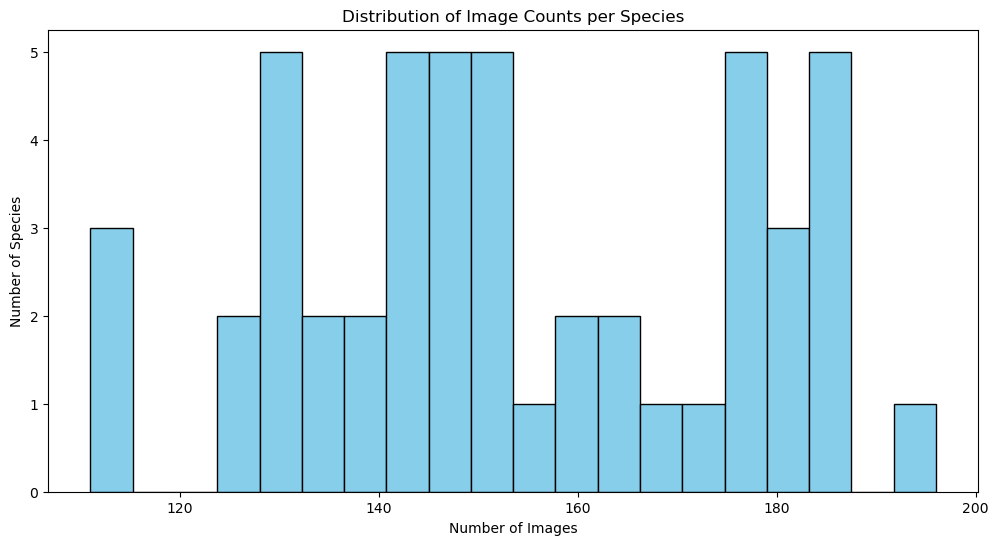

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

counts = list(species_counts.values())

print(f"Min images per species: {np.min(counts)}")
print(f"Max images per species: {np.max(counts)}")
print(f"Mean images per species: {np.mean(counts):.2f}")
print(f"Median images per species: {np.median(counts)}")

plt.figure(figsize=(12,6))
plt.hist(counts, bins=20, color='skyblue', edgecolor='black')
plt.title("Distribution of Image Counts per Species")
plt.xlabel("Number of Images")
plt.ylabel("Number of Species")
plt.show()


2. Check Image Quality and Conditions
Randomly sample images from a few species to visually inspect variability.

Look for differences in backgrounds, lighting, angles, image resolution.

You can also automate some image quality metrics if needed (e.g., blur detection).

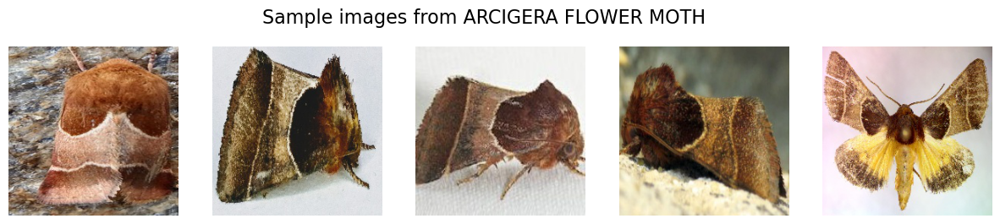

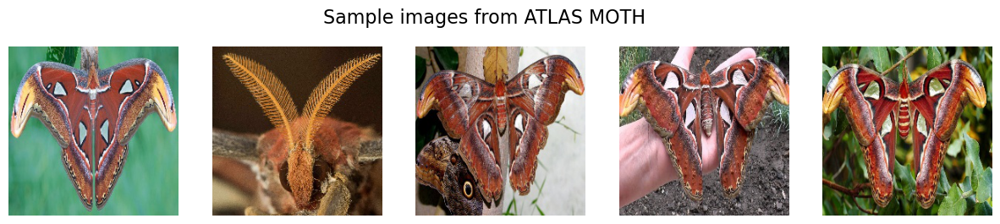

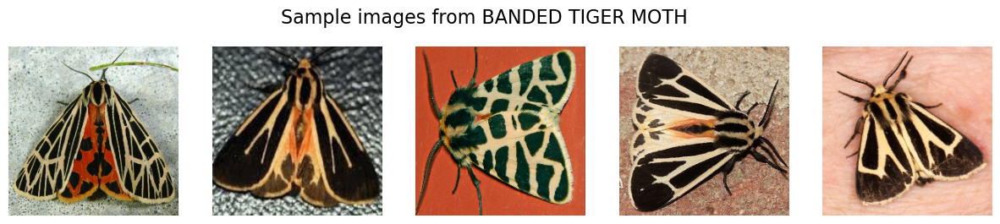

In [49]:
import random
from PIL import Image

species_to_check = ['ARCIGERA FLOWER MOTH', 'ATLAS MOTH', 'BANDED TIGER MOTH']

for species in species_to_check:
    species_folder = dataset_path / 'train' / species
    sample_images = random.sample(list(species_folder.glob('*.jpg')), 5)

    plt.figure(figsize=(15,3))
    plt.suptitle(f'Sample images from {species}', fontsize=16)
    for i, img_path in enumerate(sample_images):
        img = Image.open(img_path)
        plt.subplot(1, 5, i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()


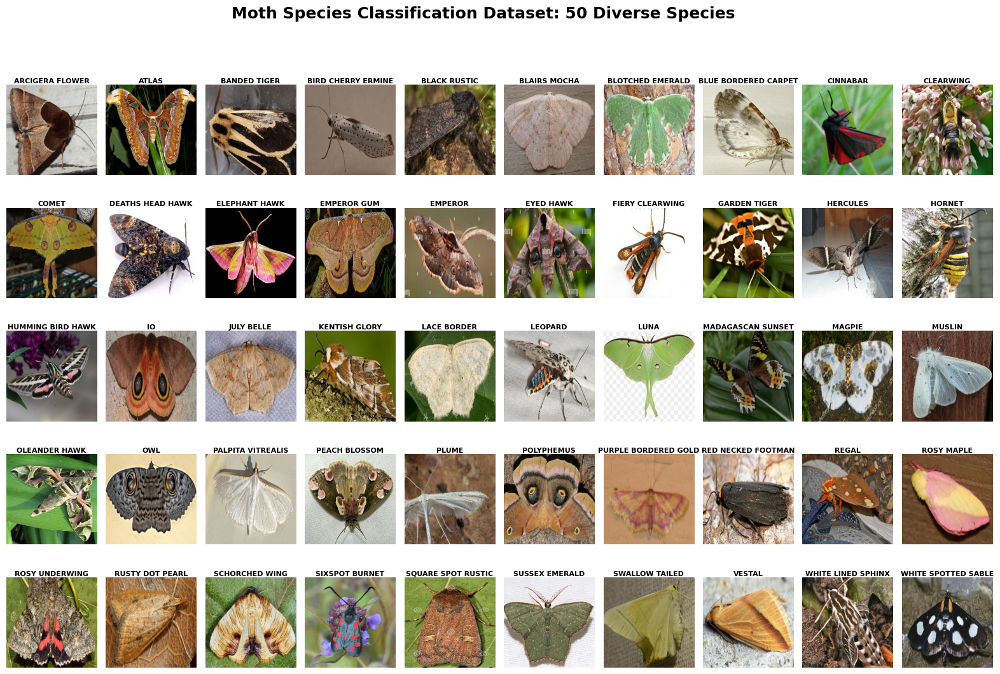

In [17]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from pathlib import Path
import numpy as np
import random

# Set up paths
data_root = Path("../data/kaggle-dataset/archive")
train_path = data_root / "train"

# Your 50 species names (in order)
species_names = [
    "ARCIGERA FLOWER MOTH", "ATLAS MOTH", "BANDED TIGER MOTH", "BIRD CHERRY ERMINE MOTH", 
    "BLACK RUSTIC MOTH", "BLAIRS MOCHA", "BLOTCHED EMERALD MOTH", "BLUE BORDERED CARPET MOTH",
    "CINNABAR MOTH", "CLEARWING MOTH", "COMET MOTH", "DEATHS HEAD HAWK MOTH",
    "ELEPHANT HAWK MOTH", "EMPEROR GUM MOTH", "EMPEROR MOTH", "EYED HAWK MOTH",
    "FIERY CLEARWING MOTH", "GARDEN TIGER MOTH", "HERCULES MOTH", "HORNET MOTH",
    "HUMMING BIRD HAWK MOTH", "IO MOTH", "JULY BELLE MOTH", "KENTISH GLORY MOTH",
    "LACE BORDER MOTH", "LEOPARD MOTH", "LUNA MOTH", "MADAGASCAN SUNSET MOTH",
    "MAGPIE MOTH", "MUSLIN MOTH", "OLEANDER HAWK MOTH", "OWL MOTH",
    "PALPITA VITREALIS MOTH", "PEACH BLOSSOM MOTH", "PLUME MOTH", "POLYPHEMUS MOTH",
    "PURPLE BORDERED GOLD MOTH", "RED NECKED FOOTMAN MOTH", "REGAL MOTH", "ROSY MAPLE MOTH",
    "ROSY UNDERWING MOTH", "RUSTY DOT PEARL MOTH", "SCHORCHED WING MOTH", "SIXSPOT BURNET MOTH",
    "SQUARE SPOT RUSTIC MOTH", "SUSSEX EMERALD MOTH", "SWALLOW TAILED MOTH", "VESTAL MOTH",
    "WHITE LINED SPHINX MOTH", "WHITE SPOTTED SABLE MOTH"
]

def get_representative_image(species_folder):
    """Get one representative image from a species folder"""
    image_files = list(species_folder.glob("*"))
    if image_files:
        # Take the first image (you could randomize or select based on criteria)
        return image_files[0]
    return None

def load_and_process_image(image_path, target_size=(224, 224)):
    """Load and resize image for consistent display"""
    try:
        with Image.open(image_path) as img:
            img = img.convert('RGB')  # Ensure RGB format
            img = img.resize(target_size, Image.Resampling.LANCZOS)
            return np.array(img)
    except Exception as e:
        print(f"Error loading {image_path}: {e}")
        # Return a placeholder black image if loading fails
        return np.zeros((*target_size, 3), dtype=np.uint8)

# Create the figure
fig, axes = plt.subplots(5, 10, figsize=(20, 12))
fig.suptitle('Moth Species Classification Dataset: 50 Diverse Species', 
             fontsize=18, fontweight='bold', y=0.98)

# Remove spacing between subplots
plt.subplots_adjust(hspace=0.3, wspace=0.1)

# Load and display images
for idx, species_name in enumerate(species_names):
    row = idx // 10
    col = idx % 10
    
    # Get species folder path
    species_folder = train_path / species_name
    
    # Get representative image
    image_path = get_representative_image(species_folder)
    
    if image_path:
        # Load and process image
        img_array = load_and_process_image(image_path)
        
        # Display image
        axes[row, col].imshow(img_array)
        axes[row, col].set_title(species_name.replace(' MOTH', '').replace('_', ' '), 
                                fontsize=8, fontweight='bold', pad=2)
        axes[row, col].axis('off')
        
        # Optional: Add colored border for specific species (you can customize this)
        # For example, highlight some challenging species
        challenging_species = ["CLEARWING MOTH", "HUMMING BIRD HAWK MOTH", 
                             "BANDED TIGER MOTH", "GARDEN TIGER MOTH", 
                             "MUSLIN MOTH", "BIRD CHERRY ERMINE MOTH"]
        
        if species_name in challenging_species:
            # Add red border for challenging species
            for spine in axes[row, col].spines.values():
                spine.set_edgecolor('red')
                spine.set_linewidth(2)
                spine.set_visible(True)
    else:
        # If no image found, show placeholder
        axes[row, col].text(0.5, 0.5, 'No Image\nFound', 
                           ha='center', va='center', fontsize=8)
        axes[row, col].set_title(species_name.replace(' MOTH', '').replace('_', ' '), 
                                fontsize=8, fontweight='bold')
        axes[row, col].axis('off')

plt.show()

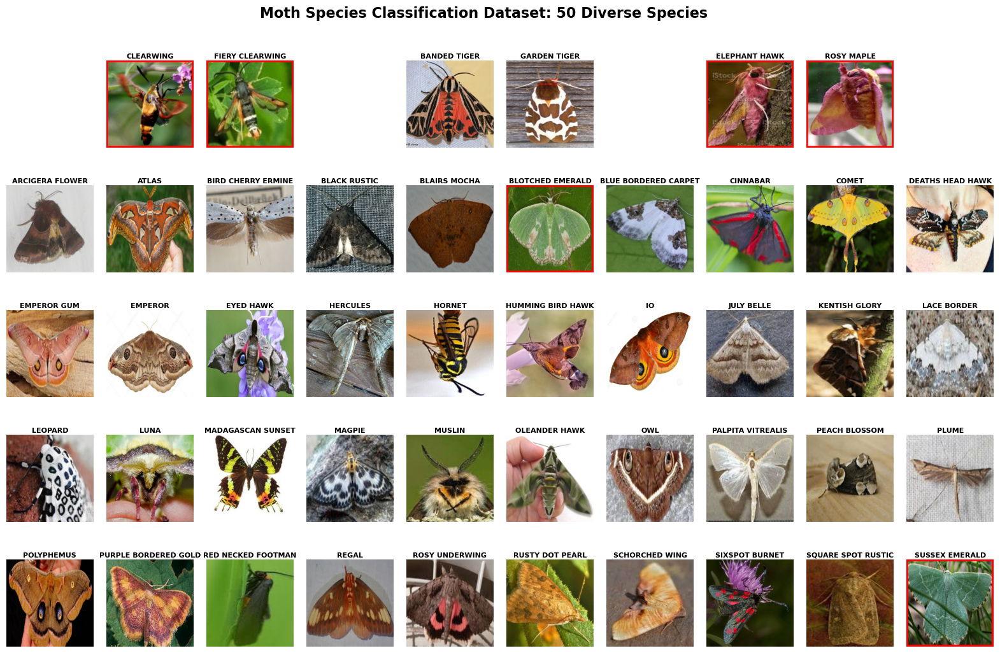

In [18]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from pathlib import Path
import numpy as np
import random

# Set up paths
data_root = Path("../data/kaggle-dataset/archive")
train_path = data_root / "train"

# Strategic layout: 3 confused pairs at top (centered), then alphabetical
species_names = [
    # Row 1: 3 Challenging Confusion Pairs (centered with spacing)
    "", "CLEARWING MOTH", "FIERY CLEARWING MOTH", "", 
    "BANDED TIGER MOTH", "GARDEN TIGER MOTH", "",
    "ELEPHANT HAWK MOTH", "ROSY MAPLE MOTH", "",
    
    # Rows 2-5: Remaining 40 species alphabetically (removed 4 to fit)
    "ARCIGERA FLOWER MOTH", "ATLAS MOTH", "BIRD CHERRY ERMINE MOTH", "BLACK RUSTIC MOTH", 
    "BLAIRS MOCHA", "BLOTCHED EMERALD MOTH", "BLUE BORDERED CARPET MOTH", "CINNABAR MOTH",
    "COMET MOTH", "DEATHS HEAD HAWK MOTH",
    
    "EMPEROR GUM MOTH", "EMPEROR MOTH", "EYED HAWK MOTH", "HERCULES MOTH",
    "HORNET MOTH", "HUMMING BIRD HAWK MOTH", "IO MOTH", "JULY BELLE MOTH", 
    "KENTISH GLORY MOTH", "LACE BORDER MOTH",
    
    "LEOPARD MOTH", "LUNA MOTH", "MADAGASCAN SUNSET MOTH", "MAGPIE MOTH",
    "MUSLIN MOTH", "OLEANDER HAWK MOTH", "OWL MOTH", "PALPITA VITREALIS MOTH",
    "PEACH BLOSSOM MOTH", "PLUME MOTH",
    
    "POLYPHEMUS MOTH", "PURPLE BORDERED GOLD MOTH", "RED NECKED FOOTMAN MOTH", "REGAL MOTH",
    "ROSY UNDERWING MOTH", "RUSTY DOT PEARL MOTH", "SCHORCHED WING MOTH", "SIXSPOT BURNET MOTH",
    "SQUARE SPOT RUSTIC MOTH", "SUSSEX EMERALD MOTH"
    # Removed: SWALLOW TAILED MOTH, VESTAL MOTH, WHITE LINED SPHINX MOTH, WHITE SPOTTED SABLE MOTH
]

# Define the 3 confused pairs for highlighting
confused_pairs = [
    ("CLEARWING MOTH", "FIERY CLEARWING MOTH"),
    ("SUSSEX EMERALD MOTH", "BLOTCHED EMERALD MOTH"),
    ("ELEPHANT HAWK MOTH", "ROSY MAPLE MOTH")
]

# Create a set of confused species for easy lookup
confused_species = set()
for pair in confused_pairs:
    confused_species.update(pair)

def get_representative_image(species_folder):
    """Get one representative image from a species folder (randomized each run)"""
    image_files = list(species_folder.glob("*"))
    if image_files:
        # Randomly select an image each time
        return random.choice(image_files)
    return None

def load_and_process_image(image_path, target_size=(224, 224)):
    """Load and resize image for consistent display"""
    try:
        with Image.open(image_path) as img:
            img = img.convert('RGB')  # Ensure RGB format
            img = img.resize(target_size, Image.Resampling.LANCZOS)
            return np.array(img)
    except Exception as e:
        print(f"Error loading {image_path}: {e}")
        # Return a placeholder black image if loading fails
        return np.zeros((*target_size, 3), dtype=np.uint8)

# Create the figure
fig, axes = plt.subplots(5, 10, figsize=(20, 12))
fig.suptitle('Moth Species Classification Dataset: 50 Diverse Species', 
             fontsize=16, fontweight='bold', y=0.95)

# Adjust spacing
plt.subplots_adjust(hspace=0.4, wspace=0.15)

# Load and display images - handle empty spaces
for idx, species_name in enumerate(species_names):
    row = idx // 10  
    col = idx % 10
    
    # Skip empty spaces (represented by empty strings)
    if species_name == "":
        axes[row, col].axis('off')
        continue
    
    # Get species folder path
    species_folder = train_path / species_name
    
    # Get representative image
    image_path = get_representative_image(species_folder)
    
    if image_path:
        # Load and process image
        img_array = load_and_process_image(image_path)
        
        # Display image
        axes[row, col].imshow(img_array)
        axes[row, col].set_title(species_name.replace(' MOTH', '').replace('_', ' '), 
                                fontsize=8, fontweight='bold', pad=3)
        axes[row, col].axis('off')
        
        # Add red border for confused species (FIXED VERSION)
        if species_name in confused_species:
            # Create a red border by adding a rectangle patch
            from matplotlib.patches import Rectangle
            rect = Rectangle((0, 0), 1, 1, linewidth=4, edgecolor='red', 
                           facecolor='none', transform=axes[row, col].transAxes)
            axes[row, col].add_patch(rect)
    else:
        # If no image found, show placeholder
        axes[row, col].text(0.5, 0.5, 'No Image\nFound', 
                           ha='center', va='center', fontsize=8)
        axes[row, col].set_title(species_name.replace(' MOTH', '').replace('_', ' '), 
                                fontsize=8, fontweight='bold')
        axes[row, col].axis('off')

plt.show()

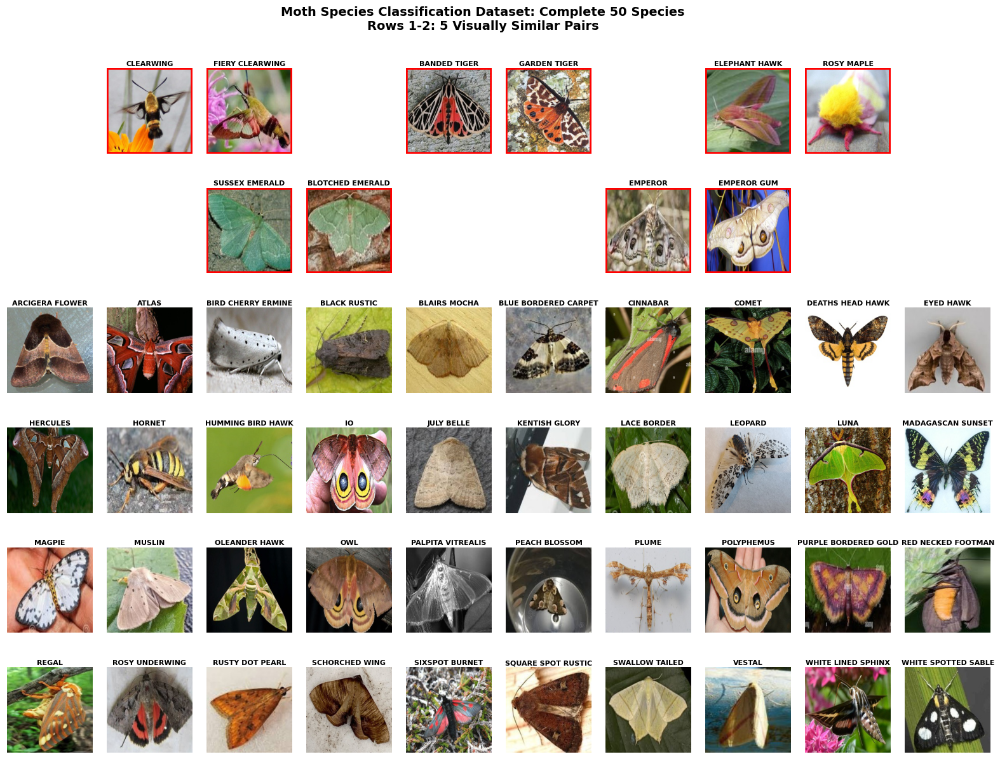

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from pathlib import Path
import numpy as np
import random

# Set up paths
data_root = Path("../data/kaggle-dataset/archive")
train_path = data_root / "train"

# Strategic layout: 5 confused pairs in 2 rows (properly centered), then alphabetical (exactly 50 positions)
species_names = [
    # Row 1: 3 Confusion Pairs (shifted right for better centering: positions 1-2, 4-5, 7-8)
    "", "CLEARWING MOTH", "FIERY CLEARWING MOTH", "", 
    "BANDED TIGER MOTH", "GARDEN TIGER MOTH", "", 
    "ELEPHANT HAWK MOTH", "ROSY MAPLE MOTH", "",
    
    # Row 2: 2 Confusion Pairs (centered: positions 2-3, 6-7)
    "", "", "SUSSEX EMERALD MOTH", "BLOTCHED EMERALD MOTH", "", "", 
    "EMPEROR MOTH", "EMPEROR GUM MOTH", "", "",
    
    # Rows 3-6: Remaining 40 species alphabetically (4 rows of 10 each)
    "ARCIGERA FLOWER MOTH", "ATLAS MOTH", "BIRD CHERRY ERMINE MOTH", "BLACK RUSTIC MOTH", 
    "BLAIRS MOCHA", "BLUE BORDERED CARPET MOTH", "CINNABAR MOTH", "COMET MOTH",
    "DEATHS HEAD HAWK MOTH", "EYED HAWK MOTH",
    
    "HERCULES MOTH", "HORNET MOTH", "HUMMING BIRD HAWK MOTH", "IO MOTH", 
    "JULY BELLE MOTH", "KENTISH GLORY MOTH", "LACE BORDER MOTH", "LEOPARD MOTH",
    "LUNA MOTH", "MADAGASCAN SUNSET MOTH",
    
    "MAGPIE MOTH", "MUSLIN MOTH", "OLEANDER HAWK MOTH", "OWL MOTH",
    "PALPITA VITREALIS MOTH", "PEACH BLOSSOM MOTH", "PLUME MOTH", "POLYPHEMUS MOTH",
    "PURPLE BORDERED GOLD MOTH", "RED NECKED FOOTMAN MOTH",
    
    "REGAL MOTH", "ROSY UNDERWING MOTH", "RUSTY DOT PEARL MOTH", "SCHORCHED WING MOTH",
    "SIXSPOT BURNET MOTH", "SQUARE SPOT RUSTIC MOTH", "SWALLOW TAILED MOTH", "VESTAL MOTH",
    "WHITE LINED SPHINX MOTH", "WHITE SPOTTED SABLE MOTH"
]

# Define the 5 confused pairs for highlighting
confused_pairs = [
    ("CLEARWING MOTH", "FIERY CLEARWING MOTH"),
    ("BANDED TIGER MOTH", "GARDEN TIGER MOTH"),
    ("ELEPHANT HAWK MOTH", "ROSY MAPLE MOTH"),
    ("SUSSEX EMERALD MOTH", "BLOTCHED EMERALD MOTH"),
    ("EMPEROR MOTH", "EMPEROR GUM MOTH")
]

# Create a set of confused species for easy lookup
confused_species = set()
for pair in confused_pairs:
    confused_species.update(pair)

def get_representative_image(species_folder):
    """Get one representative image from a species folder (randomized each run)"""
    image_files = list(species_folder.glob("*"))
    if image_files:
        # Randomly select an image each time
        return random.choice(image_files)
    return None

def load_and_process_image(image_path, target_size=(224, 224)):
    """Load and resize image for consistent display"""
    try:
        with Image.open(image_path) as img:
            img = img.convert('RGB')  # Ensure RGB format
            img = img.resize(target_size, Image.Resampling.LANCZOS)
            return np.array(img)
    except Exception as e:
        print(f"Error loading {image_path}: {e}")
        # Return a placeholder black image if loading fails
        return np.zeros((*target_size, 3), dtype=np.uint8)

# Create the figure with 6 rows instead of 7
fig, axes = plt.subplots(6, 10, figsize=(20, 14))
fig.suptitle('Moth Species Classification Dataset: Complete 50 Species\nRows 1-2: 5 Visually Similar Pairs', 
             fontsize=14, fontweight='bold', y=0.95)

# Adjust spacing
plt.subplots_adjust(hspace=0.4, wspace=0.15)

# Load and display images - handle empty spaces
for idx, species_name in enumerate(species_names):
    row = idx // 10  
    col = idx % 10
    
    # Skip empty spaces (represented by empty strings)
    if species_name == "":
        axes[row, col].axis('off')
        continue
    
    # Get species folder path
    species_folder = train_path / species_name
    
    # Get representative image
    image_path = get_representative_image(species_folder)
    
    if image_path:
        # Load and process image
        img_array = load_and_process_image(image_path)
        
        # Display image
        axes[row, col].imshow(img_array)
        axes[row, col].set_title(species_name.replace(' MOTH', '').replace('_', ' '), 
                                fontsize=8, fontweight='bold', pad=3)
        axes[row, col].axis('off')
        
        # Add red border for confused species
        if species_name in confused_species:
            # Create a red border by adding a rectangle patch
            from matplotlib.patches import Rectangle
            rect = Rectangle((0, 0), 1, 1, linewidth=4, edgecolor='red', 
                           facecolor='none', transform=axes[row, col].transAxes)
            axes[row, col].add_patch(rect)
    else:
        # If no image found, show placeholder
        axes[row, col].text(0.5, 0.5, 'No Image\nFound', 
                           ha='center', va='center', fontsize=8)
        axes[row, col].set_title(species_name.replace(' MOTH', '').replace('_', ' '), 
                                fontsize=8, fontweight='bold')
        axes[row, col].axis('off')

plt.show()

In [53]:
import os
import pandas as pd
from pathlib import Path
from collections import Counter
import numpy as np

def analyze_moth_dataset(data_root):

    # Set up paths
    train_path = data_root / "train"
    test_path = data_root / "test" 
    valid_path = data_root / "valid"  # or "validation" - adjust as needed
    
    # Get all species folders from train directory
    species_folders = [f.name for f in train_path.iterdir() if f.is_dir()]
    
    species_data = []
    
    for species in species_folders:
        # Count images in each split
        train_images = len([f for f in (train_path / species).iterdir() 
                           if f.suffix.lower() in ['.jpg', '.jpeg', '.png']])
        
        test_images = len([f for f in (test_path / species).iterdir() 
                          if f.suffix.lower() in ['.jpg', '.jpeg', '.png']])
        
        valid_images = len([f for f in (valid_path / species).iterdir() 
                           if f.suffix.lower() in ['.jpg', '.jpeg', '.png']])
        
        total_images = train_images + test_images + valid_images
        
        species_data.append({
            'Species Name': species.replace('_', ' ').title(),
            'Train': train_images,
            'Valid': valid_images,
            'Test': test_images,
            'Total': total_images
        })
    
    # Create DataFrame
    df = pd.DataFrame(species_data)
    df = df.sort_values('Species Name')
    
    # Calculate totals
    totals = {
        'Species Name': '**TOTAL**',
        'Train': df['Train'].sum(),
        'Valid': df['Valid'].sum(), 
        'Test': df['Test'].sum(),
        'Total': df['Total'].sum()
    }
    
    # Add totals row
    df = pd.concat([df, pd.DataFrame([totals])], ignore_index=True)
    
    return df

# Usage:
data_root = Path("../data/kaggle-dataset/archive")

# Analyse the dataset
dataset_df = analyze_moth_dataset(data_root)

# Display the dataframe
print("Dataset Composition:")
print(dataset_df)

# Additional statistics
print("\n" + "="*60)
print("Summary Statistics:")
print("="*60)
print(f"Total species: {len(dataset_df) - 1}")  # -1 for totals row
print(f"Total images: {dataset_df.iloc[-1]['Total']}")
print(f"Average images per species: {dataset_df.iloc[:-1]['Total'].mean():.1f}")
print(f"Min images per species: {dataset_df.iloc[:-1]['Total'].min()}")
print(f"Max images per species: {dataset_df.iloc[:-1]['Total'].max()}")

# Check split ratios
train_ratio = dataset_df.iloc[-1]['Train'] / dataset_df.iloc[-1]['Total']
valid_ratio = dataset_df.iloc[-1]['Valid'] / dataset_df.iloc[-1]['Total'] 
test_ratio = dataset_df.iloc[-1]['Test'] / dataset_df.iloc[-1]['Total']

print(f"\nSplit ratios:")
print(f"Train: {train_ratio:.1%}")
print(f"Valid: {valid_ratio:.1%}")
print(f"Test: {test_ratio:.1%}")

Dataset Composition:
                 Species Name  Train  Valid  Test  Total
0        Arcigera Flower Moth    140      5     5    150
1                  Atlas Moth    129      5     5    139
2           Banded Tiger Moth    136      5     5    146
3     Bird Cherry Ermine Moth    133      5     5    143
4           Black Rustic Moth    134      5     5    144
5                Blairs Mocha    177      5     5    187
6       Blotched Emerald Moth    117      5     5    127
7   Blue Bordered Carpet Moth    121      5     5    131
8               Cinnabar Moth    131      5     5    141
9              Clearwing Moth    122      5     5    132
10                 Comet Moth    105      5     5    115
11      Deaths Head Hawk Moth    169      5     5    179
12         Elephant Hawk Moth    160      5     5    170
13           Emperor Gum Moth    136      5     5    146
14               Emperor Moth    142      5     5    152
15             Eyed Hawk Moth    165      5     5    175
16       F

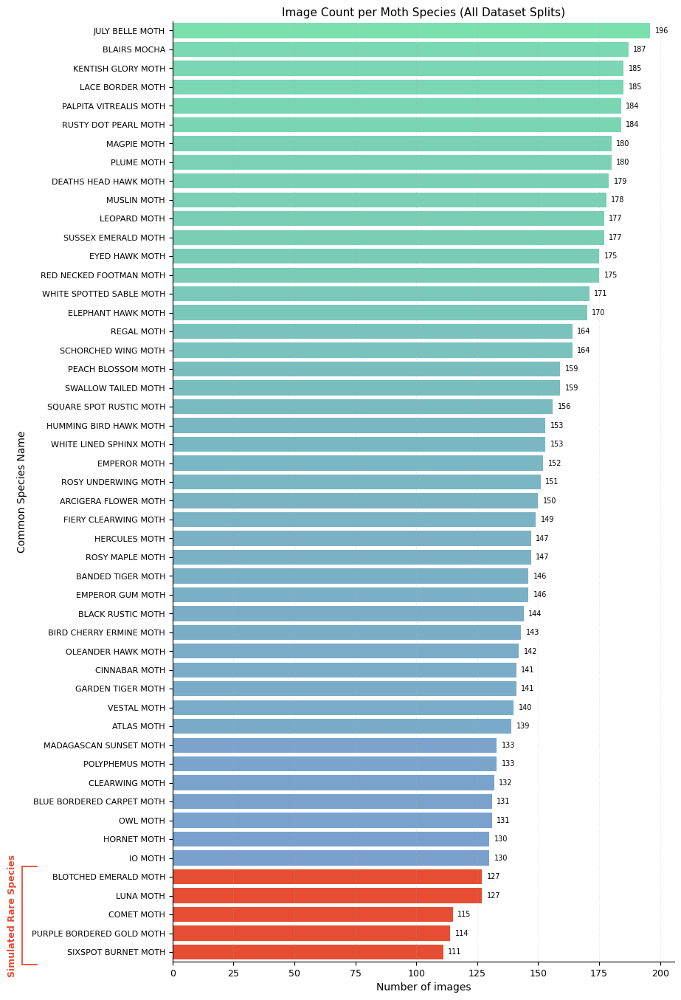

In [ ]:
from collections import defaultdict
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np

# Load counts
dataset_path = Path("../data/kaggle-dataset/archive")
counts = defaultdict(int)
for split in ["train", "valid", "test"]:
    p = dataset_path / split
    if not p.exists():
        continue
    for d in p.iterdir():
        if d.is_dir():
            counts[d.name] += sum(1 for _ in d.glob("*.*"))

# Prepare data
species, totals = zip(*sorted(counts.items(), key=lambda kv: kv[1], reverse=True))
n_rare = 5
highlight_color = np.array([0.9, 0.3, 0.2, 1.0])  
bracket_color = (0.9, 0.3, 0.2)

# Gradient colours
norm = (np.array(totals) - min(totals)) / (max(totals) - min(totals) + 1e-9)
colors = (1 - 0.6) * plt.cm.winter(0.2 + 0.8*norm) + 0.6 * np.array([0.8, 0.8, 0.8, 1.0])
for i in range(len(species) - n_rare, len(species)):
    colors[i] = highlight_color

# Plot
fig, ax = plt.subplots(figsize=(10, 14))
ax.barh(range(len(species)), totals, color=colors)
ax.set_yticks(range(len(species)))
ax.set_yticklabels(species, fontsize=8)
ax.invert_yaxis()
ax.set_ylim(len(species) - 0.5, -0.5)  
ax.set_xlabel("Number of images")
ax.set_ylabel("Common Species Name")
ax.set_title("Image Count per Moth Species (All Dataset Splits)", pad=5)
ax.grid(axis="x", linestyle=":", alpha=0.35)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)

# Bracket for rare species 
N = len(species)
first_idx = N - n_rare
last_idx = N - 1
x_bracket = -0.3
tick_len = 0.03
shift_down = 0.45
y_top = 1 - ((first_idx - 0.5 + shift_down) / N)
y_bot = 1 - ((last_idx + 0.7 + shift_down) / N)
y_mid = (y_top + y_bot) / 2

ax.plot([x_bracket, x_bracket], [y_bot, y_top],
        transform=ax.transAxes, color=bracket_color, linewidth=1.3, clip_on=False)
ax.plot([x_bracket, x_bracket + tick_len], [y_top, y_top],
        transform=ax.transAxes, color=bracket_color, linewidth=1.3, clip_on=False)
ax.plot([x_bracket, x_bracket + tick_len], [y_bot, y_bot],
        transform=ax.transAxes, color=bracket_color, linewidth=1.3, clip_on=False)
ax.text(x_bracket - 0.01, y_mid, "Simulated Rare Species",
        transform=ax.transAxes, va="center", ha="right",
        fontsize=9, fontweight="bold", rotation=90, color=bracket_color)

# Counts at bar ends
xmax = max(totals)
for i, v in enumerate(totals):
    ax.text(v + 0.01 * xmax, i, str(v), va="center", fontsize=7)

fig.subplots_adjust(left=0.30, right=0.98, top=0.95, bottom=0.04)
plt.show()


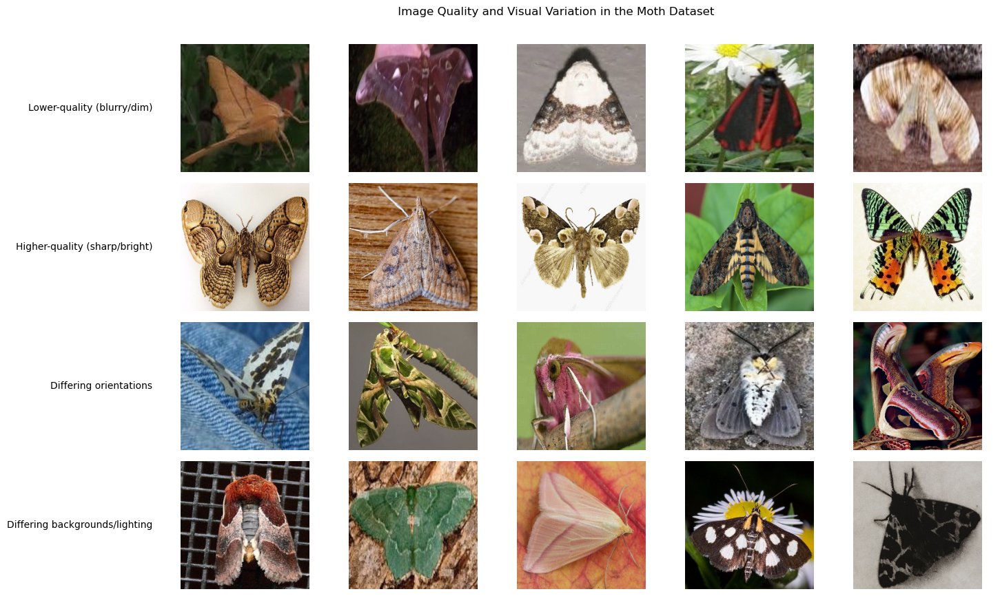

In [134]:
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt

dataset_path = Path("../data/kaggle-dataset/archive/train")

rows = [
    [
        dataset_path/"JULY BELLE MOTH"/"060.jpg",
        dataset_path/"HERCULES MOTH"/"048.jpg",
        dataset_path/"BLUE BORDERED CARPET MOTH"/"050.jpg",
        dataset_path/"CINNABAR MOTH"/"058.jpg",
        dataset_path/"SCHORCHED WING MOTH"/"090.jpg",
    ],
    [
        dataset_path/"OWL MOTH"/"054.jpg",
        dataset_path/"RUSTY DOT PEARL MOTH"/"005.jpg",
        dataset_path/"PEACH BLOSSOM MOTH"/"022.jpg",
        dataset_path/"DEATHS HEAD HAWK MOTH"/"010.jpg",
        dataset_path/"MADAGASCAN SUNSET MOTH"/"033.jpg",
    ],
    [
        dataset_path/"MAGPIE MOTH"/"147.jpg",
        dataset_path/"OLEANDER HAWK MOTH"/"017.jpg",
        dataset_path/"ELEPHANT HAWK MOTH"/"017.jpg",
        dataset_path/"MUSLIN MOTH"/"091.jpg",
        dataset_path/"ATLAS MOTH"/"049.jpg",
    ],
    [
        dataset_path/"ARCIGERA FLOWER MOTH"/"021.jpg",
        dataset_path/"SUSSEX EMERALD MOTH"/"141.jpg",
        dataset_path/"VESTAL MOTH"/"032.jpg",
        dataset_path/"WHITE SPOTTED SABLE MOTH"/"028.jpg",
        dataset_path/"GARDEN TIGER MOTH"/"051.jpg",
    ],
]

labels = [
    "Lower-quality (blurry/dim)",
    "Higher-quality (sharp/bright)",
    "Differing orientations",
    "Differing backgrounds/lighting",
]

fig, ax = plt.subplots(figsize=(13, 9))
ax.axis("off")

pad = 0.02
tile_w = (1 - pad * 4) / 5
tile_h = (1 - pad * 3) / 4

for r, row in enumerate(rows):
    for c, p in enumerate(row):
        x0, y0 = c * (tile_w + pad), 1 - (r + 1) * tile_h - r * pad
        tile_ax = ax.inset_axes([x0, y0, tile_w, tile_h])
        try:
            tile_ax.imshow(Image.open(p).convert("RGB"))
        except Exception as e:
            tile_ax.text(0.5, 0.5, f"Error\n{e}", ha="center", va="center", fontsize=6)
        tile_ax.axis("off")

for r, label in enumerate(labels):
    y_center = 1 - (r + 0.5) * tile_h - r * pad
    ax.text(-0.02, y_center, label, transform=ax.transAxes,
            ha="right", va="center", fontsize=10)

fig.suptitle(" Image Quality and Visual Variation in the Moth Dataset", y=0.98, fontsize=12)
fig.subplots_adjust(left=0.07, right=0.99, top=0.92, bottom=0.04)
plt.show()


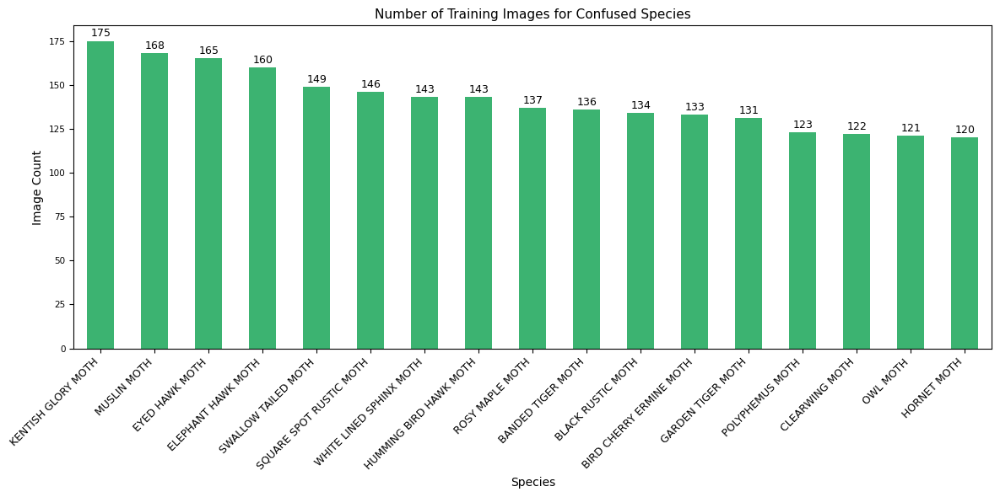

In [135]:
from pathlib import Path  
import pandas as pd
import matplotlib.pyplot as plt

# Define universal path to data
data_root = Path("../data/kaggle-dataset/archive")
csv_path = data_root / "MOTHS.csv"

# Load CSV
df = pd.read_csv(csv_path)

# Columns in your CSV
label_col = 'labels'
dataset_col = 'data set'

# Filter only training data
df_train = df[df[dataset_col] == 'train']

# Count training images per species
species_counts_train = df_train[label_col].value_counts().sort_values(ascending=False)

# Confused species list from new top-4 model results
confused_species = [
    "BANDED TIGER MOTH",
    "BIRD CHERRY ERMINE MOTH",
    "BLACK RUSTIC MOTH",
    "CLEARWING MOTH",
    "ELEPHANT HAWK MOTH",
    "EYED HAWK MOTH",
    "GARDEN TIGER MOTH",
    "HORNET MOTH",
    "HUMMING BIRD HAWK MOTH",
    "KENTISH GLORY MOTH",
    "MUSLIN MOTH",
    "OWL MOTH",
    "POLYPHEMUS MOTH",
    "ROSY MAPLE MOTH",
    "SQUARE SPOT RUSTIC MOTH",
    "SWALLOW TAILED MOTH",
    "WHITE LINED SPHINX MOTH"
]

# Filter to confused species
confused_counts_train = species_counts_train[
    species_counts_train.index.isin(confused_species)
].sort_values(ascending=False)

# Plot
plt.figure(figsize=(12, 6))
ax = confused_counts_train.plot(kind='bar', color='mediumseagreen')

# Annotate counts above bars
for i, (label, count) in enumerate(confused_counts_train.items()):
    ax.text(i, count + 1, str(count), ha='center', va='bottom', fontsize=9)

plt.title("Number of Training Images for Confused Species")
plt.ylabel("Image Count")
plt.xlabel("Species")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()


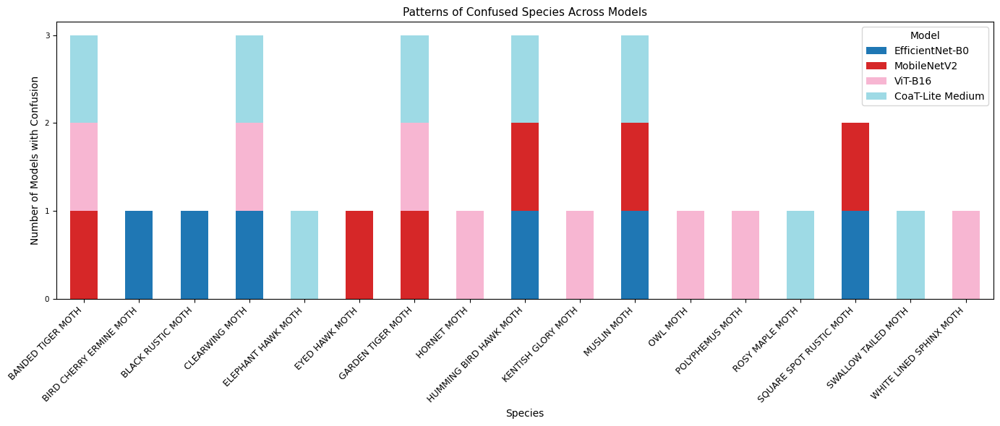

In [139]:
from collections import defaultdict
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator  # <-- import for integer ticks

# Define confused pairs from all models
confused_pairs = [
    # EfficientNet-B0
    ("CLEARWING MOTH", "HUMMING BIRD HAWK MOTH", "EfficientNet-B0"),
    ("HUMMING BIRD HAWK MOTH", "BLACK RUSTIC MOTH", "EfficientNet-B0"),
    ("MUSLIN MOTH", "BIRD CHERRY ERMINE MOTH", "EfficientNet-B0"),
    ("SQUARE SPOT RUSTIC MOTH", "BLACK RUSTIC MOTH", "EfficientNet-B0"),

    # MobileNetV2
    ("BANDED TIGER MOTH", "GARDEN TIGER MOTH", "MobileNetV2"),
    ("HUMMING BIRD HAWK MOTH", "EYED HAWK MOTH", "MobileNetV2"),
    ("MUSLIN MOTH", "SQUARE SPOT RUSTIC MOTH", "MobileNetV2"),

    # ViT-B16
    ("CLEARWING MOTH", "HORNET MOTH", "ViT-B16"),
    ("GARDEN TIGER MOTH", "BANDED TIGER MOTH", "ViT-B16"),
    ("KENTISH GLORY MOTH", "WHITE LINED SPHINX MOTH", "ViT-B16"),
    ("POLYPHEMUS MOTH", "OWL MOTH", "ViT-B16"),

    # CoaT-Lite Medium
    ("BANDED TIGER MOTH", "GARDEN TIGER MOTH", "CoaT-Lite Medium"),
    ("CLEARWING MOTH", "HUMMING BIRD HAWK MOTH", "CoaT-Lite Medium"),
    ("ELEPHANT HAWK MOTH", "ROSY MAPLE MOTH", "CoaT-Lite Medium"),
    ("SWALLOW TAILED MOTH", "MUSLIN MOTH", "CoaT-Lite Medium")
]

# Create matrix
species_model_matrix = defaultdict(lambda: {
    "EfficientNet-B0": 0,
    "MobileNetV2": 0,
    "ViT-B16": 0,
    "CoaT-Lite Medium": 0
})

for s1, s2, model in confused_pairs:
    species_model_matrix[s1][model] = 1
    species_model_matrix[s2][model] = 1

species_df = pd.DataFrame.from_dict(species_model_matrix, orient="index")
species_df = species_df.sort_index()

# Plot
ax = species_df.plot(kind='bar', stacked=True, figsize=(14, 6), colormap='tab20')
ax.yaxis.set_major_locator(MaxNLocator(integer=True))  

plt.title("Patterns of Confused Species Across Models")
plt.ylabel("Number of Models with Confusion")
plt.xlabel("Species")
plt.xticks(rotation=45, ha="right")
plt.legend(title="Model")
plt.tight_layout()
plt.show()


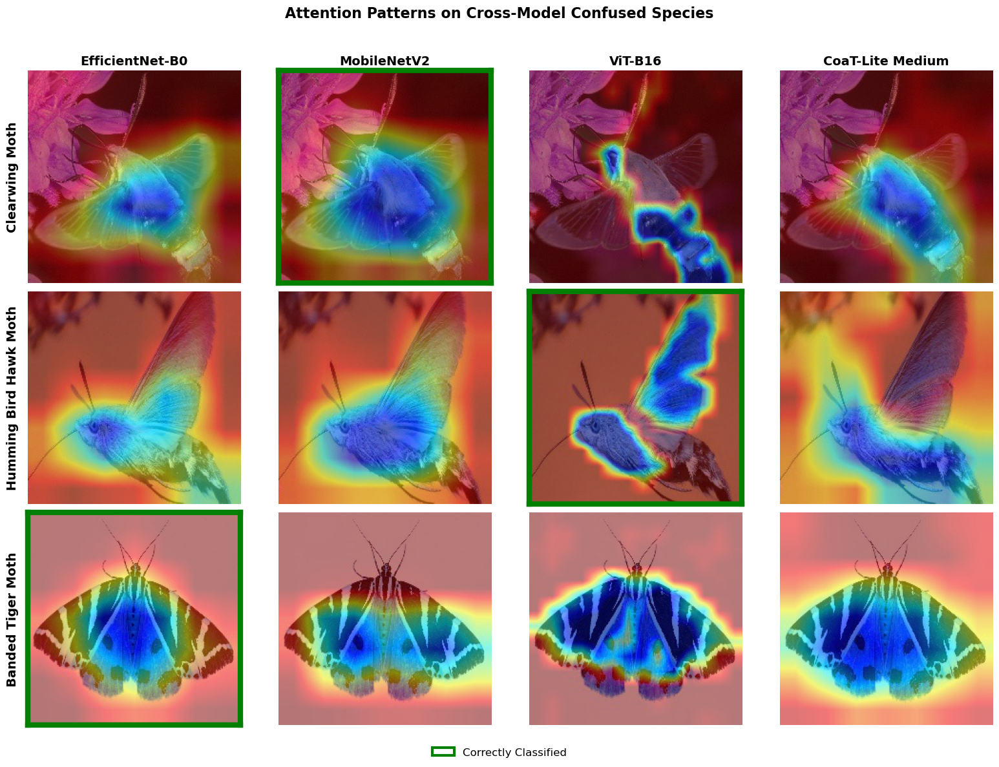

In [159]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from matplotlib.patches import Patch
from pathlib import Path

# Base relative path from 'notebooks' folder
base_path = Path("../cam_outputs")

# Mapping species to their image paths (relative)
image_paths = {
    "Clearwing Moth": {
        "EfficientNet-B0": base_path / "efficientnet_b0" / "gradcampp-clearwing-1.jpg",
        "MobileNetV2": base_path / "mobilenet_v2" / "score-cam-clearwing-1.jpg",
        "ViT-B16": base_path / "vit_b16" / "score-cam-clearwing-1.jpg",
        "CoaT-Lite Medium": base_path / "coat_lite" / "score-cam-clearwing-1.jpg"
    },
    "Humming Bird Hawk Moth": {
        "EfficientNet-B0": base_path / "efficientnet_b0" / "gradcampp-humming-bird-hawk-3.jpg",
        "MobileNetV2": base_path / "mobilenet_v2" / "score-cam-humming-bird-hawk-3.jpg",
        "ViT-B16": base_path / "vit_b16" / "score-cam-humming-bird-hawk-3.jpg",
        "CoaT-Lite Medium": base_path / "coat_lite" / "score-cam-humming-bird-hawk-3.jpg"
    },
    "Banded Tiger Moth": {
        "EfficientNet-B0": base_path / "efficientnet_b0" / "gradcampp-banded-tiger-2.jpg",
        "MobileNetV2": base_path / "mobilenet_v2" / "score-cam-banded-tiger-2.jpg",
        "ViT-B16": base_path / "vit_b16" / "score-cam-banded-tiger-2.jpg",
        "CoaT-Lite Medium": base_path / "coat_lite" / "score-cam-banded-tiger-2.jpg"
    }
}

# Correctly identified image paths
correct_images = {
    base_path / "efficientnet_b0" / "gradcampp-banded-tiger-2.jpg",
    base_path / "vit_b16" / "score-cam-humming-bird-hawk-3.jpg",
    base_path / "mobilenet_v2" / "score-cam-clearwing-1.jpg"
}

# Model order for columns
models = ["EfficientNet-B0", "MobileNetV2", "ViT-B16", "CoaT-Lite Medium"]
species_order = ["Clearwing Moth", "Humming Bird Hawk Moth", "Banded Tiger Moth"]

# Create figure (3 rows, 4 columns)
fig, axes = plt.subplots(len(species_order), len(models), figsize=(16, 12))

# Loop through species (rows)
for row_idx, species in enumerate(species_order):
    for col_idx, model in enumerate(models):
        ax = axes[row_idx, col_idx]
        img_path = image_paths[species][model]
        img = mpimg.imread(img_path)
        ax.imshow(img)

        # Hide ticks but keep axes so borders are visible
        ax.set_xticks([])
        ax.set_yticks([])

        # Add green border if correct
        if img_path in correct_images:
            for spine in ax.spines.values():
                spine.set_visible(True)  # ensure spine is drawn
                spine.set_edgecolor("green")
                spine.set_linewidth(6)
        else:
            for spine in ax.spines.values():
                spine.set_visible(False)

        # Column titles
        if row_idx == 0:
            ax.set_title(model, fontsize=14, fontweight='bold')

        # Row labels
        if col_idx == 0:
            ax.set_ylabel(species, fontsize=14, fontweight='bold', labelpad=10)

# Add main title
fig.suptitle("Attention Patterns on Cross-Model Confused Species", fontsize=16, fontweight='bold')

# Add legend for green border
legend_patch = Patch(facecolor='none', edgecolor='green', linewidth=3, label='Correctly Classified')
fig.legend(handles=[legend_patch], loc='lower center', ncol=1, fontsize=12, frameon=False)

# Adjust layout
plt.tight_layout(rect=[0, 0.04, 1, 0.96])  
plt.show()


Figure 13B-1: EfficientNet-B0 (Grad-CAM++)


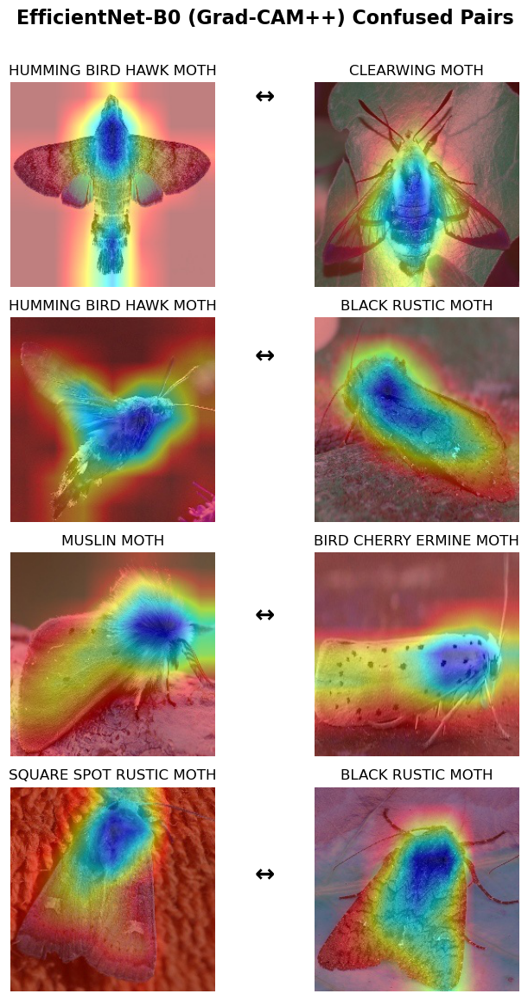

Figure 13B-2: MobileNetV2 (Score-CAM)


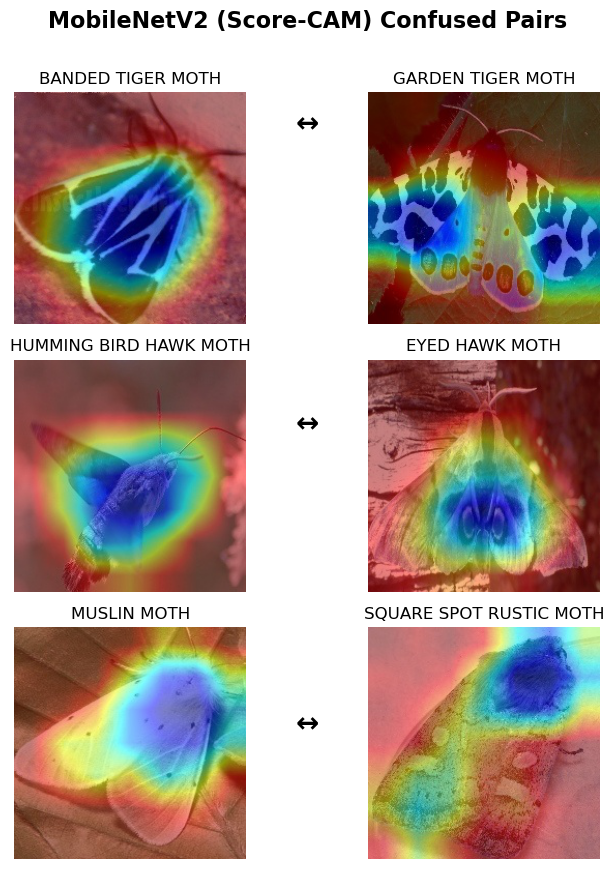

Figure 13B-3: ViT-B16 (Score-CAM)


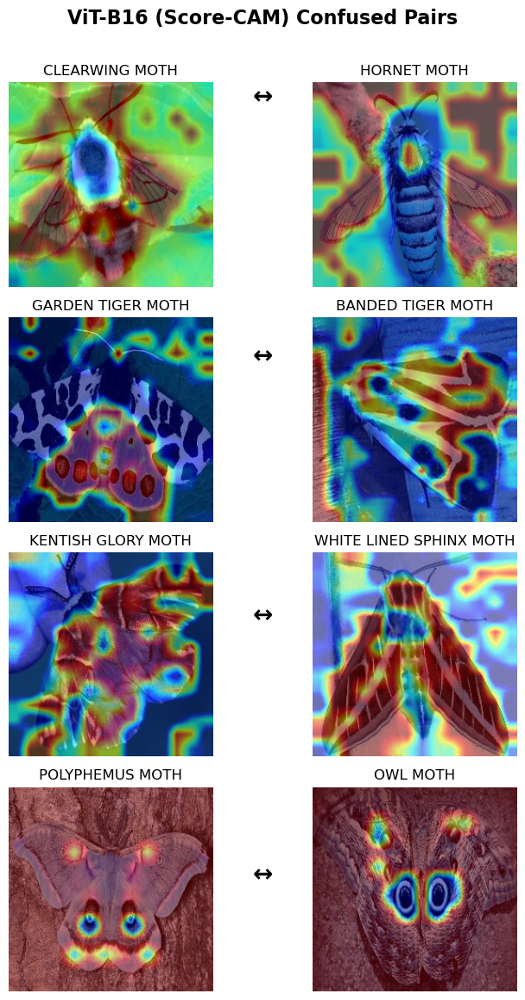

Figure 13B-4: CoaT-Lite Medium (Score-CAM)


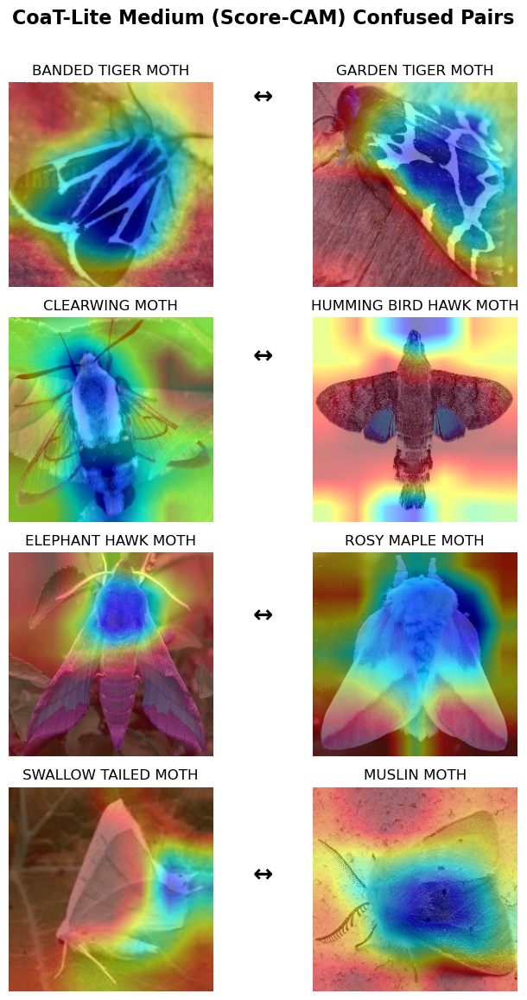

In [160]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from pathlib import Path

# Base path from 'notebooks' folder
base_path = Path("../cam_outputs")

# Confused pairs dictionary
confused_pairs_images = {
    "EfficientNet-B0 (Grad-CAM++)": [
        ("HUMMING BIRD HAWK MOTH", "CLEARWING MOTH",
         base_path / "efficientnet_b0" / "gradcampp-humming-bird-hawk-4.jpg",
         base_path / "efficientnet_b0" / "gradcampp-clearwing-4.jpg"),
        ("HUMMING BIRD HAWK MOTH", "BLACK RUSTIC MOTH",
         base_path / "efficientnet_b0" / "gradcampp-humming-bird-hawk-1.jpg",
         base_path / "efficientnet_b0" / "gradcampp-black-rustic-5.jpg"),
        ("MUSLIN MOTH", "BIRD CHERRY ERMINE MOTH",
         base_path / "efficientnet_b0" / "gradcampp-muslin-5.jpg",
         base_path / "efficientnet_b0" / "gradcampp-bird-cherry-ermine-4.jpg"),
        ("SQUARE SPOT RUSTIC MOTH", "BLACK RUSTIC MOTH",
         base_path / "efficientnet_b0" / "gradcampp-square-spot-rustic-4.jpg",
         base_path / "efficientnet_b0" / "gradcampp-black-rustic-1.jpg")
    ],
    "MobileNetV2 (Score-CAM)": [
        ("BANDED TIGER MOTH", "GARDEN TIGER MOTH",
         base_path / "mobilenet_v2" / "score-cam-banded-tiger-3.jpg",
         base_path / "mobilenet_v2" / "score-cam-garden-tiger-5.jpg"),
        ("HUMMING BIRD HAWK MOTH", "EYED HAWK MOTH",
         base_path / "mobilenet_v2" / "score-cam-humming-bird-hawk-2.jpg",
         base_path / "mobilenet_v2" / "score-cam-eyed-hawk-2.jpg"),
        ("MUSLIN MOTH", "SQUARE SPOT RUSTIC MOTH",
         base_path / "mobilenet_v2" / "score-cam-muslin-1.jpg",
         base_path / "mobilenet_v2" / "score-cam-square-spot-rustic-2.jpg")
    ],
    "ViT-B16 (Score-CAM)": [
        ("CLEARWING MOTH", "HORNET MOTH",
         base_path / "vit_b16" / "score-cam-clearwing-5.jpg",
         base_path / "vit_b16" / "score-cam-hornet-5.jpg"),
        ("GARDEN TIGER MOTH", "BANDED TIGER MOTH",
         base_path / "vit_b16" / "score-cam-garden-tiger-5.jpg",
         base_path / "vit_b16" / "score-cam-banded-tiger-4.jpg"),
        ("KENTISH GLORY MOTH", "WHITE LINED SPHINX MOTH",
         base_path / "vit_b16" / "score-cam-kentish-glory-3.jpg",
         base_path / "vit_b16" / "score-cam-white-lined-sphinx-5.jpg"),
        ("POLYPHEMUS MOTH", "OWL MOTH",
         base_path / "vit_b16" / "score-cam-polyphemus-5.jpg",
         base_path / "vit_b16" / "score-cam-owl-5.jpg")
    ],
    "CoaT-Lite Medium (Score-CAM)": [
        ("BANDED TIGER MOTH", "GARDEN TIGER MOTH",
         base_path / "coat_lite" / "score-cam-banded-tiger-3.jpg",
         base_path / "coat_lite" / "score-cam-garden-tiger-2.jpg"),
        ("CLEARWING MOTH", "HUMMING BIRD HAWK MOTH",
         base_path / "coat_lite" / "score-cam-clearwing-5.jpg",
         base_path / "coat_lite" / "score-cam-humming-bird-hawk-4.jpg"),
        ("ELEPHANT HAWK MOTH", "ROSY MAPLE MOTH",
         base_path / "coat_lite" / "score-cam-elephant-hawk-2.jpg",
         base_path / "coat_lite" / "score-cam-rosy-maple-4.jpg"),
        ("SWALLOW TAILED MOTH", "MUSLIN MOTH",
         base_path / "coat_lite" / "score-cam-swallow-tailed-5.jpg",
         base_path / "coat_lite" / "score-cam-muslin-3.jpg")
    ]
}

def plot_confused_pairs(model_name, pairs):
    rows = len(pairs)
    fig, axes = plt.subplots(rows, 2, figsize=(8, 3*rows))
    fig.suptitle(f"{model_name} Confused Pairs",
                 fontsize=16, fontweight='bold', y=0.96)  # lowered from 1.02

    for r, (spec_a, spec_b, path_a, path_b) in enumerate(pairs):
        if rows == 1:
            ax_a, ax_b = axes
        else:
            ax_a, ax_b = axes[r]

        img_a = mpimg.imread(path_a)
        ax_a.imshow(img_a)
        ax_a.set_title(spec_a, fontsize=12)
        ax_a.axis("off")

        img_b = mpimg.imread(path_b)
        ax_b.imshow(img_b)
        ax_b.set_title(spec_b, fontsize=12)
        ax_b.axis("off")

        # Arrow between images
        fig.text(0.5, (rows - r - 0.5) / rows, "↔", 
                 ha='center', va='center', fontsize=20, fontweight='bold')

    plt.tight_layout(rect=[0, 0, 1, 0.95])  # tighter layout
    plt.show()

# Plot each model separately
for i, (model, pairs) in enumerate(confused_pairs_images.items(), start=1):
    print(f"Figure 13B-{i}: {model}")
    plot_confused_pairs(model, pairs)
